In [1]:
import numpy as np
from tqdm import tqdm, trange
from brian2 import *
import matplotlib.pyplot as plt
import RE16_4ring_v6
from util import *
from fit import *
FIG_PATH = 'figures/'
os.makedirs(FIG_PATH, exist_ok=True)


23:50:44 [info] Using Brian2CUDA device: cuda_standalone


In [2]:
CONST = 12288

SyntaxError: invalid syntax (663676779.py, line 1)

In [2]:
F = 1/3
_WEIGHT_MATRIX_SYMMETRY = np.array([
    [F, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, F, F],
    [F, F, F, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, F, F, F, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, F, F, F, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, F, F, 0, 0, F, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, F, F, F, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, F, F, F, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, F, F, F, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, F, F, F, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, F, F, F, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, F, F, F, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, F, 0, 0, F, F, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, F, F, F, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, F, F, F, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, F, F, F],
    [F, F, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, F]
], dtype=np.float32)

def process_data(data):
    '''
    input: data: (16, 16, T)
    output: out: (16, 16, T)
    '''
    W = _WEIGHT_MATRIX_SYMMETRY.astype(np.float32)
    C = np.zeros((16, 18), dtype=W.dtype)
    C[np.arange(8), np.arange(8)] = 1
    C[np.arange(8, 16), np.arange(10, 18)] = 1
    L = C @ W.T @ C.T   # (16, 16)
    R = C @ W   @ C.T  # (16, 16)
    out = np.einsum('ai, ijt, jb -> abt', L, data, R, optimize=True)  # (16, 16, T) 
    return out

# Simulation config

In [3]:
parameters = {'w_EE': 0.72, 'w_EI': 0.14, 'w_IE': 0.74, 'w_II': 0.01, 'w_EP': 0.01, 'w_PE': 0.71, 'w_PP': 0.01}


In [4]:
w_EI_range = np.arange(0.01, 0.4, 0.01) # 0.143
w_EP_range = np.arange(0.0, 0.01, 0.001) # 0.012
w_PE_range = np.arange(0.60, 1.00, 0.01) # 0.71
total_simulations = len(w_EI_range) * len(w_EP_range) * len(w_PE_range) *1.5/60/20
print(f'Total simulations: {total_simulations}')

Total simulations: 19.5


In [5]:
conf = {
  "w_EE": 0.72,
  "w_EI": 0.143, # 0.143
  "w_IE": 0.74, # 0.74
  "w_II": 0.01, # 0.01
  "w_PP": 0.01,
  "w_EP": 0.012, # 0.012
  "w_PE": 0.71, # .709
  "sigma": 0.000,
  "shifter_strength": 0.014,

  "stimulus_strength": 0.5,
  "stimulus_location": 0,
  "t_epg_open": 200,
  "t_epg_close": 500,
  "t_pen_open": 3000,
  "half_PEN": 'right',
  "target": 0
}

In [6]:
results = RE16_4ring_v6.simulator(w_EE = conf['w_EE'], # EB <-> EB
                                    w_EI = conf['w_EI'], # EPG -> R # 0.15
                                    w_IE = conf['w_IE'], # R -> EPG
                                    w_II = conf['w_II'], # R <-> R
                                    w_PP = conf['w_PP'], # PEN <-> PEN
                                    w_EP = conf['w_EP'], # EB -> PEN 
                                    w_PE = conf['w_PE'], # PEN -> EB
                                    sigma = conf['sigma'], # noise level
                                    
                                    stimulus_strength = conf['stimulus_strength'], 
                                    stimulus_location = conf['stimulus_location'], # from 0 to np.pi
                                    shifter_strength = conf['shifter_strength'],
                                    half_PEN = conf['half_PEN'],

                                    debug = 0,
                                    target = conf['target'],
                                    )
t, fr, fr_r, fr_p = results
print(fr.shape)

processed_data = process_data(fr)
# Plot the last frame
plt.figure(figsize=(8, 6))
last_frame = processed_data[:, :, -1]
im_last = plt.imshow(last_frame, cmap='Blues', aspect='auto', interpolation='none',
                     vmin=0, vmax=200)
plt.colorbar(im_last, label='Firing Rate [Hz]')
plt.xlabel('x')
plt.ylabel('y')
plt.title(f'Final state (t = {(processed_data.shape[2]-1)/10000:.2f} s)')
plt.tight_layout()
plt.show()

INFO       CUDA installation directory detected via location of `nvcc` binary: /usr [brian2cuda.utils.gputools]


23:50:48 : 0 min 3.4 sec -> simulation start


INFO       Compiling device code for GPU 0 (NVIDIA GeForce RTX 5090) [brian2cuda.utils.gputools]
INFO       Compiling device code for compute capability 12.0 (compiler flags: ['-arch=sm_120']) [brian2cuda.device]
INFO       Using the following preferences for CUDA standalone: [brian2cuda.device]
INFO       	devices.cuda_standalone.SM_multiplier = 1 [brian2cuda.device]
INFO       	devices.cuda_standalone.parallel_blocks = 1 [brian2cuda.device]
INFO       	devices.cuda_standalone.launch_bounds = False [brian2cuda.device]
INFO       	devices.cuda_standalone.syn_launch_bounds = False [brian2cuda.device]
INFO       	devices.cuda_standalone.calc_occupancy = True [brian2cuda.device]
INFO       	devices.cuda_standalone.extra_threshold_kernel = True [brian2cuda.device]
INFO       	devices.cuda_standalone.random_number_generator_type = CURAND_RNG_PSEUDO_DEFAULT [brian2cuda.device]
INFO       	devices.cuda_standalone.random_number_generator_ordering = False [brian2cuda.device]
INFO       	devices

RuntimeError: Project compilation failed (error code: 512).

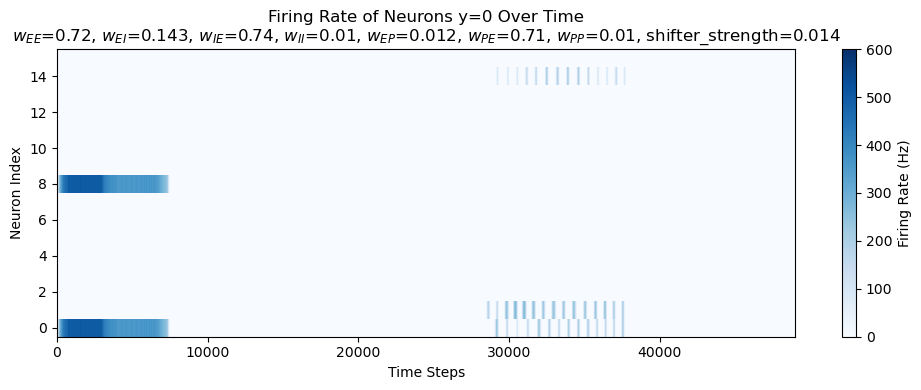

<Figure size 640x480 with 0 Axes>

In [ ]:
target = conf['target']
plt.figure(figsize=(10, 4))

# Create imshow plot with time on x-axis and neuron index on y-axis
# Using parameters: w_EE={conf['w_EE']}, w_EI={conf['w_EI']}, w_IE={conf['w_IE']}, w_II={conf['w_II']}
# w_PP={conf['w_PP']}, w_EP={conf['w_EP']}, w_PE={conf['w_PE']}, sigma={conf['sigma']}, shifter_strength={conf['shifter_strength']}
im = plt.imshow(fr[:, 0, :], aspect='auto', cmap='Blues', origin='lower', interpolation='none', vmin=0, vmax=600)
plt.title(f'Firing Rate of Neurons y={target} Over Time\n$w_{{EE}}$={conf["w_EE"]}, $w_{{EI}}$={conf["w_EI"]}, $w_{{IE}}$={conf["w_IE"]}, $w_{{II}}$={conf["w_II"]}, $w_{{EP}}$={conf["w_EP"]}, $w_{{PE}}$={conf["w_PE"]}, $w_{{PP}}$={conf["w_PP"]}, shifter_strength={conf["shifter_strength"]}')
plt.xlabel('Time Steps')
plt.ylabel('Neuron Index')
plt.colorbar(im, label='Firing Rate (Hz)')
plt.tight_layout()
plt.show()
# Save the figure
plt.savefig(f'{FIG_PATH}firing_rate_heatmap_y{target}.png', dpi=300, bbox_inches='tight')



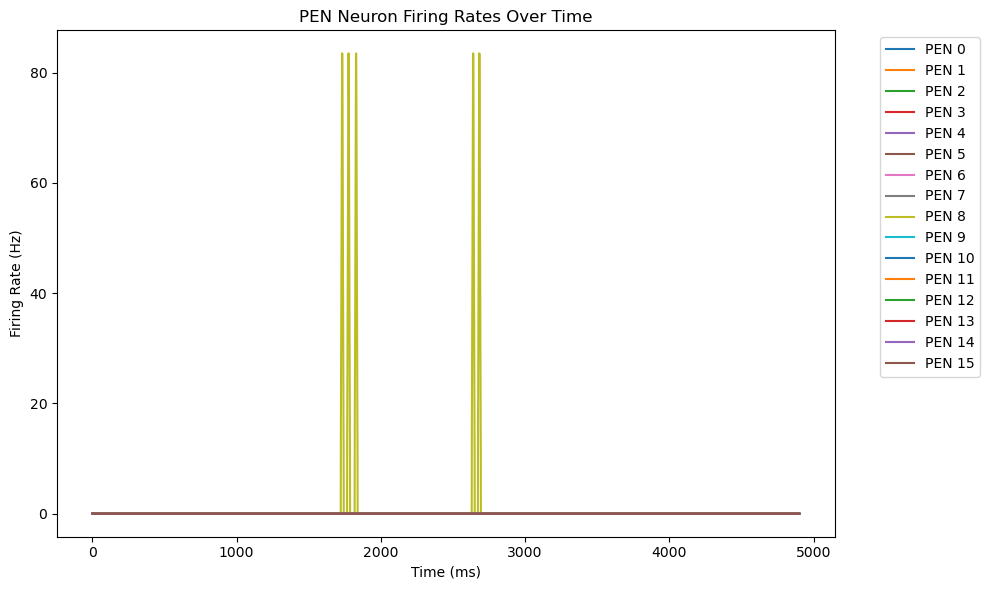

In [ ]:
# Plot PEN firing rate data
plt.figure(figsize=(10, 6))
plt.plot(t/ms, fr_p.T)
plt.xlabel('Time (ms)')
plt.ylabel('Firing Rate (Hz)')
plt.title('PEN Neuron Firing Rates Over Time')
plt.legend([f'PEN {i}' for i in range(fr_p.shape[0])], bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

WARNING    /home/pajucg/miniconda3/envs/comphys/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
 [py.warnings]


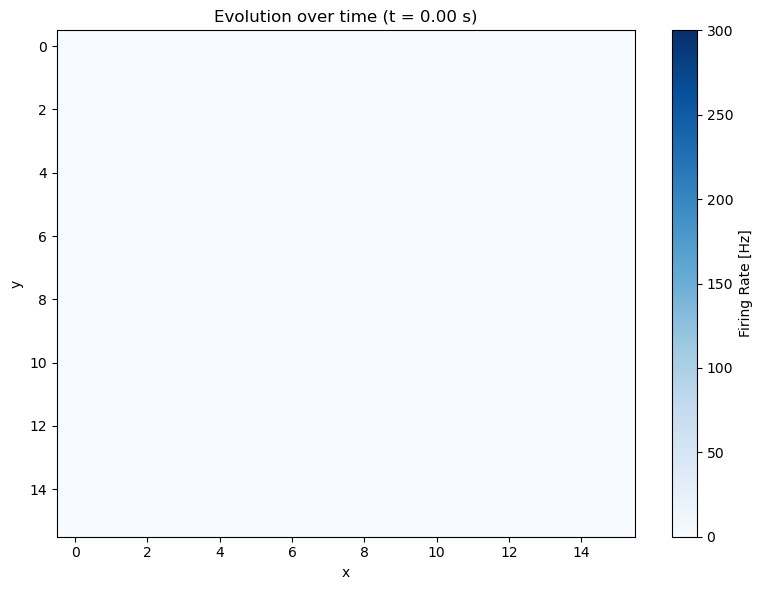

In [ ]:
import os
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.animation as animation
from IPython.display import HTML
processed_data = process_data(fr)

# Set fixed colorbar range from 0 to 600
vmin = 0
vmax = 300

# Create animation to visualize evolution by time
fig, ax = plt.subplots(figsize=(8, 6))

# Set up the plot with fixed colorbar range
im = ax.imshow(processed_data[:, :, 0], cmap='Blues', aspect='auto', interpolation='none',
               vmin=vmin, vmax=vmax)
cbar = plt.colorbar(im, label='Firing Rate [Hz]')
ax.set_xlabel('x')
ax.set_ylabel('y')
title = ax.set_title('Evolution over time (t = 0.00 s)')

# Animation function
def animate(frame):
    # Update every 100 frames to reduce file size (adjust as needed)
    time_step = frame * 100
    if time_step < processed_data.shape[2]:
        im.set_array(processed_data[:, :, time_step])
        # Keep consistent colorbar range throughout animation
        title.set_text(f'Evolution over time (t = {time_step/10000:.2f} s)')
    return [im, title]

# Create animation
total_frames = processed_data.shape[2] // 100
anim = animation.FuncAnimation(fig, animate, frames=total_frames, 
                             interval=100, blit=False, repeat=True)

# Save as gif
gif_path = os.path.join(FIG_PATH, f'evolution_animation_{time.strftime("%Y%m%d_%H%M%S")}.gif')
from tqdm.auto import tqdm

pbar = None
def progress_callback(i, n):
    global pbar
    if pbar is None:
        pbar = tqdm(total=n, desc='Saving GIF')
    pbar.update(1)
    if i == n - 1:
        pbar.close()

# anim.save(gif_path, writer='pillow', fps=10, progress_callback=progress_callback)
plt.tight_layout()
plt.show()

# Display the animation
HTML(anim.to_jshtml())


In [ ]:
processed_data = process_data(fr)
# Fit 2D Gaussian to find bump position over time
from scipy.optimize import curve_fit
import numpy as np

def gaussian_2d_periodic(xy, amplitude, x0, y0, sigma_x, sigma_y, theta, offset):
    """2D Gaussian function with periodic boundary conditions"""
    x, y = xy
    
    # Apply periodic boundary conditions
    dx = x - x0
    dy = y - y0
    
    # Find the shortest distance considering periodicity (16x16 grid)
    dx = np.where(dx > 8, dx - 16, dx)
    dx = np.where(dx < -8, dx + 16, dx)
    dy = np.where(dy > 8, dy - 16, dy)
    dy = np.where(dy < -8, dy + 16, dy)
    
    a = (np.cos(theta)**2)/(2*sigma_x**2) + (np.sin(theta)**2)/(2*sigma_y**2)
    b = -(np.sin(2*theta))/(4*sigma_x**2) + (np.sin(2*theta))/(4*sigma_y**2)
    c = (np.sin(theta)**2)/(2*sigma_x**2) + (np.cos(theta)**2)/(2*sigma_y**2)
    
    return offset + amplitude * np.exp(-(a*dx**2 + 2*b*dx*dy + c*dy**2))

# Create coordinate grids once
x = np.arange(processed_data.shape[1])
y = np.arange(processed_data.shape[0])
X, Y = np.meshgrid(x, y)
xy_data = np.vstack([X.ravel(), Y.ravel()])

# Pre-allocate arrays for better performance
n_frames = processed_data.shape[2] // 10
bump_positions = np.zeros((n_frames, 2))
fit_params = np.zeros((n_frames, 7))

# Define bounds once
bounds = ([0, 0, 0, 0.1, 0.1, -np.pi, -np.inf],
          [np.inf, 16, 16, 10, 10, np.pi, np.inf])

# Pre-compute common values for efficiency
sigma_init = 2.0
theta_init = 0.0
max_iterations = 500  # Reduced from 1000 for faster fitting

# Vectorized preprocessing for all frames
time_indices = np.arange(0, processed_data.shape[2], 10)
data_slices = processed_data[:, :, time_indices]

# Find all max positions at once
max_indices = np.unravel_index(np.argmax(data_slices.reshape(data_slices.shape[0] * data_slices.shape[1], -1), axis=0), 
                               data_slices.shape[:2])
max_vals = data_slices[max_indices[0], max_indices[1], np.arange(len(time_indices))]
min_vals = np.min(data_slices.reshape(-1, data_slices.shape[2]), axis=0)

# Fit Gaussian for each time step with optimized loop
for i in tqdm(range(n_frames), desc="Fitting 2D Gaussians"):
    data_slice = data_slices[:, :, i]
    
    # Use pre-computed values
    max_val = max_vals[i]
    min_val = min_vals[i]
    max_y, max_x = max_indices[0][i], max_indices[1][i]
    
    # Initial guess for parameters (vectorized)
    initial_guess = np.array([
        max_val,             # amplitude
        max_x,               # x0 (center x)
        max_y,               # y0 (center y)
        sigma_init,          # sigma_x
        sigma_init,          # sigma_y
        theta_init,          # theta (rotation)
        min_val              # offset
    ])
    
    try:
        # Flatten the data for fitting
        z_data = data_slice.ravel()
        
        # Fit the periodic 2D Gaussian with reduced iterations
        popt, _ = curve_fit(gaussian_2d_periodic, xy_data, z_data, 
                           p0=initial_guess, bounds=bounds, maxfev=max_iterations)
        
        bump_positions[i] = [popt[1], popt[2]]  # x0, y0
        fit_params[i] = popt
        
    except Exception:
        # If fitting fails, use the maximum position (clamp to bounds)
        max_x_clamped = np.clip(max_x, 0, 15)
        max_y_clamped = np.clip(max_y, 0, 15)
        bump_positions[i] = [max_x_clamped, max_y_clamped]
        fit_params[i] = initial_guess


Fitting 2D Gaussians:  16%|█▌        | 782/4900 [00:04<00:31, 131.50it/s]

Fitting 2D Gaussians: 100%|██████████| 4900/4900 [00:39<00:00, 123.69it/s]


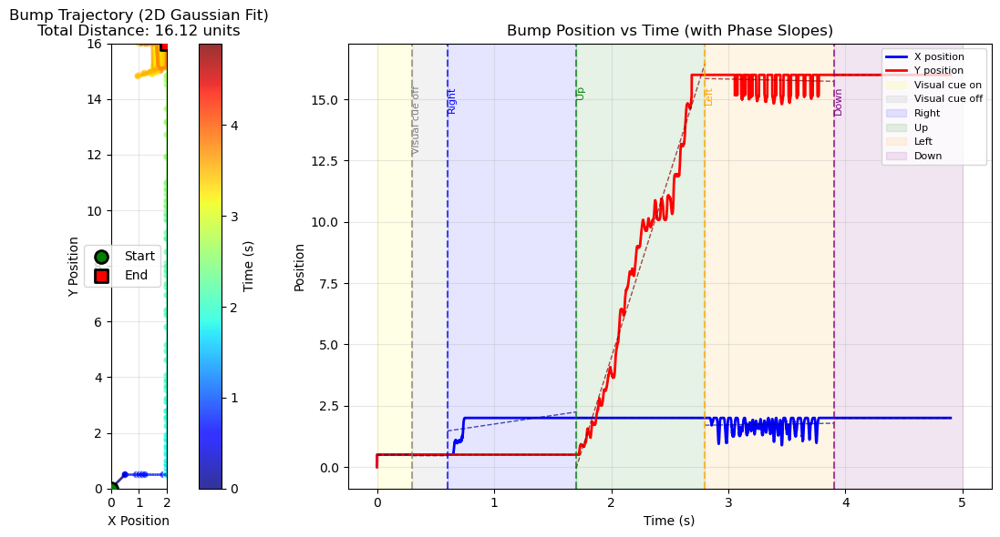


Trajectory Analysis:
Start point: (0.000, 0.000)
End point: (2.000, 16.000)
Total distance between start and end: 16.125 units

Phase-based velocity analysis:
Visual cue on  : vx= 0.033, vy= 0.033, speed= 0.047 units/s
Visual cue off : vx= 0.000, vy= 0.000, speed= 0.000 units/s
Right          : vx= 0.704, vy=-0.000, speed= 0.704 units/s
Up             : vx=-0.000, vy=15.010, speed=15.010 units/s
Left           : vx= 0.072, vy=-0.103, speed= 0.125 units/s
Down           : vx=-0.000, vy=-0.000, speed= 0.000 units/s

Phase summary:
Visual cue on  : 0.0-0.3s (0.3s duration), speed=0.047 units/s
Visual cue off : 0.3-0.6s (0.3s duration), speed=0.000 units/s
Right          : 0.6-1.7s (1.1s duration), speed=0.704 units/s
Up             : 1.7-2.8s (1.1s duration), speed=15.010 units/s
Left           : 2.8-3.9s (1.1s duration), speed=0.125 units/s
Down           : 3.9-4.9s (1.0s duration), speed=0.000 units/s
Distance between start and end: 16.125 units


In [ ]:
# Optimized, vectorized trajectory analysis and plotting
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection

# Ensure arrays
bump_positions = np.asarray(bump_positions)
fit_params = np.asarray(fit_params)

# Vectorized periodic unwrapping (period 16, threshold 8)
def unwrap_periodic(series: np.ndarray, threshold: float = 8.0, period: float = 16.0) -> np.ndarray:
    diffs = np.diff(series, prepend=series[0])
    jumps = np.zeros_like(diffs, dtype=float)
    pos_jump = diffs[1:] > threshold
    neg_jump = diffs[1:] < -threshold
    jumps[1:][pos_jump] = -period
    jumps[1:][neg_jump] = period
    correction = np.cumsum(jumps)
    return series + correction

bp = np.empty_like(bump_positions, dtype=float)
bp[:, 0] = unwrap_periodic(bump_positions[:, 0], threshold=8.0, period=16.0)
bp[:, 1] = unwrap_periodic(bump_positions[:, 1], threshold=8.0, period=16.0)

# Time points (seconds)
time_points = np.arange(0, processed_data.shape[2], 10) / 10000.0

# Calculate distance between start and end points
start_point = bp[0]
end_point = bp[-1]
total_distance = np.sqrt((end_point[0] - start_point[0])**2 + (end_point[1] - start_point[1])**2)

# Phases
phases = [
    (0.0, 0.3, 'Visual cue on', 'red'),
    (0.3, 0.6, 'Visual cue off', 'gray'),
    (0.6, 1.7, 'Right', 'blue'),
    (1.7, 2.8, 'Up', 'green'),
    (2.8, 3.9, 'Left', 'orange'),
    (3.9, 4.9, 'Down', 'purple'),
]

# Compute per-phase slopes once
phase_results = {}
for start_time, end_time, phase_name, color in phases:
    phase_mask = (time_points >= start_time) & (time_points <= end_time)
    if np.sum(phase_mask) > 1:
        t = time_points[phase_mask]
        x = bp[phase_mask, 0]
        y = bp[phase_mask, 1]
        x_slope, x_intercept = np.polyfit(t, x, 1)
        y_slope, y_intercept = np.polyfit(t, y, 1)
        phase_results[phase_name] = {
            'color': color,
            'start': start_time,
            'end': end_time,
            'x_slope': float(x_slope),
            'x_intercept': float(x_intercept),
            'y_slope': float(y_slope),
            'y_intercept': float(y_intercept),
            'speed': float(np.hypot(x_slope, y_slope)),
            't': t,
        }

# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# 1) Trajectory with LineCollection
points = bp
segments = np.stack([points[:-1], points[1:]], axis=1)
lc = LineCollection(segments, cmap='jet', linewidths=2, alpha=0.8)
lc.set_array(time_points[:-1])
ax1.add_collection(lc)
ax1.set_xlim(points[:, 0].min(), points[:, 0].max())
ax1.set_ylim(points[:, 1].min(), points[:, 1].max())

# Scatter markers every 10th point
time_mask = (np.arange(len(time_points)) % 10) == 0
ax1.scatter(points[time_mask, 0], points[time_mask, 1],
            c=time_points[time_mask], cmap='jet', s=30, alpha=0.7,
            edgecolors='white', linewidth=0.5)

# Start/End markers
ax1.scatter(points[0, 0], points[0, 1], c='green', s=100, marker='o',
            label='Start', edgecolors='black', linewidth=2, zorder=10)
ax1.scatter(points[-1, 0], points[-1, 1], c='red', s=100, marker='s',
            label='End', edgecolors='black', linewidth=2, zorder=10)
ax1.set_xlabel('X Position')
ax1.set_ylabel('Y Position')
ax1.set_title(f'Bump Trajectory (2D Gaussian Fit)\nTotal Distance: {total_distance:.2f} units')
ax1.legend()
ax1.grid(True, alpha=0.3)
ax1.set_aspect('equal')
fig.colorbar(lc, ax=ax1, label='Time (s)')

# 2) Position vs time with reused linear fits
ax2.plot(time_points, points[:, 0], 'b-', label='X position', linewidth=2)
ax2.plot(time_points, points[:, 1], 'r-', label='Y position', linewidth=2)
for phase_name, res in phase_results.items():
    t = res['t']
    ax2.plot(t, res['x_slope'] * t + res['x_intercept'], '--', color='darkblue', alpha=0.7, linewidth=1)
    ax2.plot(t, res['y_slope'] * t + res['y_intercept'], '--', color='darkred', alpha=0.7, linewidth=1)

# Phase markers and spans
phase_times_markers = [0.3, 0.6, 1.7, 2.8, 3.9, 5.0]
phase_labels = ['Visual cue off', 'Right', 'Up', 'Left', 'Down', 'End']
phase_colors = ['gray', 'blue', 'green', 'orange', 'purple', 'black']
for t, label, color in zip(phase_times_markers, phase_labels, phase_colors):
    if t <= time_points[-1]:
        ax2.axvline(x=t, color=color, linestyle='--', alpha=0.7)
        ax2.text(t, ax2.get_ylim()[1] * 0.9, label, rotation=90,
                 verticalalignment='top', fontsize=8, color=color)
ax2.axvspan(0, 0.3, alpha=0.1, color='yellow', label='Visual cue on')
ax2.axvspan(0.3, 0.6, alpha=0.1, color='gray', label='Visual cue off')
ax2.axvspan(0.6, 1.7, alpha=0.1, color='blue', label='Right')
ax2.axvspan(1.7, 2.8, alpha=0.1, color='green', label='Up')
ax2.axvspan(2.8, 3.9, alpha=0.1, color='orange', label='Left')
ax2.axvspan(3.9, 5.0, alpha=0.1, color='purple', label='Down')
ax2.set_xlabel('Time (s)')
ax2.set_ylabel('Position')
ax2.set_title('Bump Position vs Time (with Phase Slopes)')
ax2.legend(loc='upper right', fontsize=8)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print distance and velocity information
print(f"\nTrajectory Analysis:")
print("=" * 50)
print(f"Start point: ({start_point[0]:.3f}, {start_point[1]:.3f})")
print(f"End point: ({end_point[0]:.3f}, {end_point[1]:.3f})")
print(f"Total distance between start and end: {total_distance:.3f} units")

print("\nPhase-based velocity analysis:")
print("=" * 50)
for start_time, end_time, phase_name, color in phases:
    if phase_name in phase_results:
        res = phase_results[phase_name]
        print(f"{phase_name:15s}: vx={res['x_slope']:6.3f}, vy={res['y_slope']:6.3f}, speed={res['speed']:6.3f} units/s")

print("\nPhase summary:")
print("=" * 50)
for start_time, end_time, phase_name, color in phases:
    if phase_name in phase_results:
        res = phase_results[phase_name]
        duration = end_time - start_time
        print(f"{phase_name:15s}: {start_time:.1f}-{end_time:.1f}s ({duration:.1f}s duration), speed={res['speed']:.3f} units/s")

print(f"Distance between start and end: {total_distance:.3f} units")

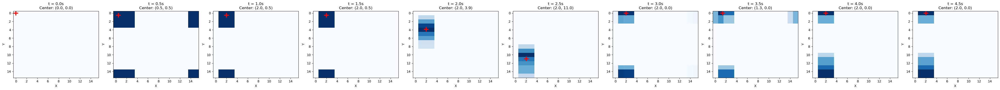

In [ ]:
# Show example fits at different time points
# Calculate how many frames we need to show every 0.5s till the end
total_time = len(fit_params) * 10 / 10000  # Total time in seconds
time_intervals = []
t = 0.0
while t <= total_time:
    time_intervals.append(t)
    t += 0.5

# Calculate grid size needed - plot in one row
n_plots = len(time_intervals)
n_cols = n_plots
n_rows = 1

# Dynamically adjust figure size based on number of plots
subplot_width = 4  # Width per subplot
subplot_height = 4  # Height per subplot
fig_width = subplot_width * n_cols +3
fig_height = subplot_height * n_rows

fig, axes = plt.subplots(n_rows, n_cols, figsize=(fig_width, fig_height))
if n_cols == 1:
    axes = [axes]
else:
    axes = axes.flatten()

# Plot frames every 0.5s
example_times = [int(t * 10000 / 10) for t in time_intervals]  # Convert to frame indices

for i, t_idx in enumerate(example_times):
    if t_idx < len(fit_params):
        t_actual = t_idx * 10
        data_slice = processed_data[:, :, t_actual]
        
        # Generate fitted surface
        fitted_surface = gaussian_2d_periodic(np.vstack([X.ravel(), Y.ravel()]), *fit_params[t_idx]).reshape(X.shape)
        
        # Plot original data
        im = axes[i].imshow(data_slice, cmap='Blues', aspect='auto', interpolation='none')
        
        # Overlay fitted center
        axes[i].plot(fit_params[t_idx][1], fit_params[t_idx][2], 'r+', markersize=15, markeredgewidth=3)
        
        axes[i].set_title(f't = {time_intervals[i]:.1f}s\nCenter: ({fit_params[t_idx][1]:.1f}, {fit_params[t_idx][2]:.1f})')
        axes[i].set_xlabel('X')
        axes[i].set_ylabel('Y')

plt.tight_layout()
plt.show()

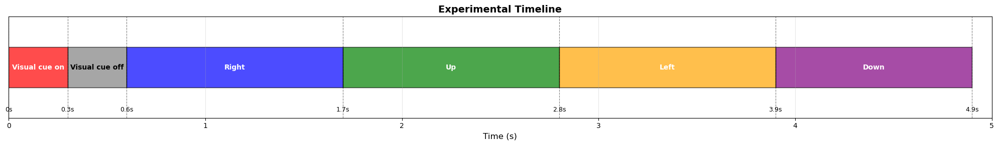

In [ ]:
# Create a timeline visualization showing the experimental phases
fig, ax = plt.subplots(1, 1, figsize=(20, 3))

# Define the phases and their time ranges
phases = [
    (0.0, 0.3, 'Visual cue on', 'red'),
    (0.3, 0.6, 'Visual cue off', 'gray'),
    (0.6, 1.7, 'Right', 'blue'),
    (1.7, 2.8, 'Up', 'green'),
    (2.8, 3.9, 'Left', 'orange'),
    (3.9, 4.9, 'Down', 'purple')
]

# Plot each phase as a colored rectangle
y_pos = 0.5
height = 0.4

for start, end, label, color in phases:
    ax.barh(y_pos, end - start, left=start, height=height, 
            color=color, alpha=0.7, edgecolor='black', linewidth=1)
    
    # Add text label in the center of each phase
    center_x = (start + end) / 2
    ax.text(center_x, y_pos, label, ha='center', va='center', 
            fontweight='bold', fontsize=10, color='white' if color != 'gray' else 'black')

# Customize the plot
ax.set_xlim(0, 5.0)
ax.set_ylim(0, 1)
ax.set_xlabel('Time (s)', fontsize=12)
ax.set_title('Experimental Timeline', fontsize=14, fontweight='bold')

# Remove y-axis ticks and labels since they're not meaningful
ax.set_yticks([])

# Add grid for better readability
ax.grid(True, axis='x', alpha=0.3)

# Add time markers
time_markers = [0, 0.3, 0.6, 1.7, 2.8, 3.9, 4.9]
for t in time_markers:
    ax.axvline(x=t, color='black', linestyle='--', alpha=0.5, linewidth=0.8)
    ax.text(t, 0.05, f'{t}s', ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()
